In [1]:
#hide
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 727kB 7.7MB/s 
     |████████████████████████████████| 1.2MB 50.8MB/s 
     |████████████████████████████████| 194kB 55.0MB/s 
     |████████████████████████████████| 51kB 9.3MB/s 
     |████████████████████████████████| 61kB 9.7MB/s 
     |████████████████████████████████| 61kB 9.4MB/s 
Mounted at /content/gdrive


In [2]:
#hide
from fastbook import *
from fastai.vision.widgets import *

# Texture Classification

In this work, 3 types of texture images are collected, namely rought, liquid, light textures. And classifier is trained to classify images into one of three categories.

In [3]:
def search_images_ddg(term, max_images=200):
    "Search for `term` with DuckDuckGo and return a unique urls of about `max_images` images"
    assert max_images<1000
    url = 'https://duckduckgo.com/'
    res = urlread(url,data={'q':term}, decode=True)
    searchObj = re.search(r'vqd=([\d-]+)\&', res)
    assert searchObj
    requestUrl = url + 'i.js'
    params = dict(l='us-en', o='json', q=term, vqd=searchObj.group(1), f=',,,', p='1', v7exp='a')
    urls,data = set(),{'next':1}
    while len(urls)<max_images and 'next' in data:
        try:
            data = urljson(requestUrl,data=params)
            urls.update(L(data['results']).itemgot('image'))
            requestUrl = url + data['next']
        except (URLError,HTTPError): pass
        time.sleep(0.2)
    return L(urls)

In [4]:
texture_types = ['rough', 'liquid', 'light']
path = Path('textures')

In [5]:
if not path.exists():
    path.mkdir()
    for o in texture_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_ddg(f'{o} texture', max_images=50)
        download_images(dest, urls=results)

In [6]:
fns = get_image_files(path)
fns

(#279) [Path('textures/liquid/00000019.jpg'),Path('textures/liquid/00000060.jpg'),Path('textures/liquid/00000084.jpg'),Path('textures/liquid/00000032.jpg'),Path('textures/liquid/00000070.jpg'),Path('textures/liquid/00000011.jpg'),Path('textures/liquid/00000002.jpg'),Path('textures/liquid/00000066.jpg'),Path('textures/liquid/00000090.jpg'),Path('textures/liquid/00000092.jpg')...]

In [7]:
failed = verify_images(fns)
failed

(#0) []

In [8]:
failed.map(Path.unlink);

## From Data to DataLoaders

In [9]:
textures = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y=parent_label,
    item_tfms=Resize(128))

In [10]:
dls = textures.dataloaders(path)

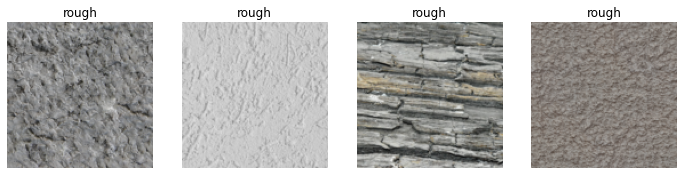

In [11]:
dls.valid.show_batch(max_n=4, nrows=1)

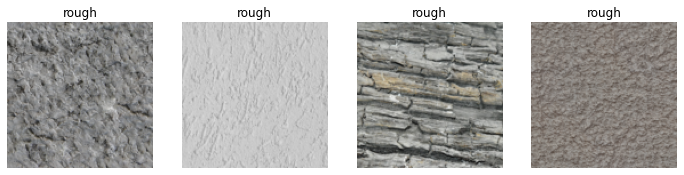

In [12]:
textures = textures.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = textures.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

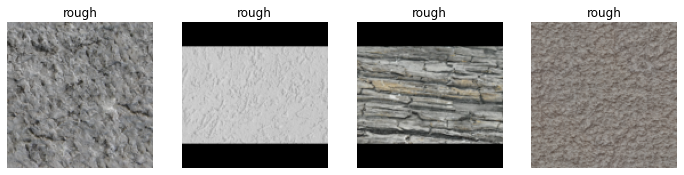

In [13]:
textures = textures.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = textures.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

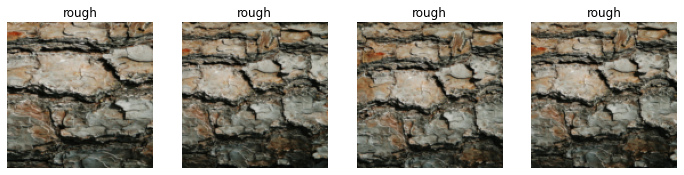

In [14]:
textures = textures.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = textures.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

### Data Augmentation

/usr/local/lib/python3.7/dist-packages/torch/_tensor.py:1023: UserWarning: torch.solve is deprecated in favor of torch.linalg.solveand will be removed in a future PyTorch release.
torch.linalg.solve has its arguments reversed and does not return the LU factorization.
To get the LU factorization see torch.lu, which can be used with torch.lu_solve or torch.lu_unpack.
X = torch.solve(B, A).solution
should be replaced with
X = torch.linalg.solve(A, B) (Triggered internally at  /pytorch/aten/src/ATen/native/BatchLinearAlgebra.cpp:760.)
  ret = func(*args, **kwargs)


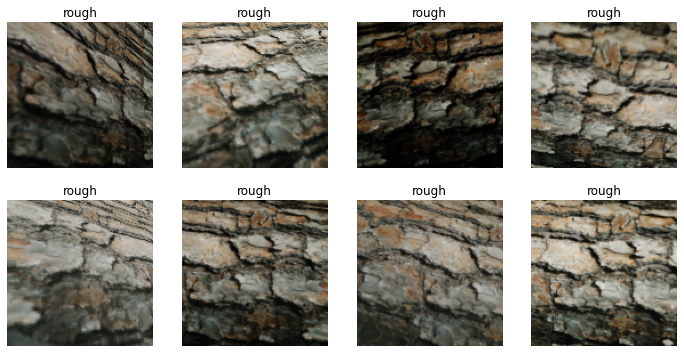

In [15]:
textures = textures.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = textures.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

## Training Your Model, and Using It to Clean Your Data

In [16]:
textures = textures.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = textures.dataloaders(path)

In [17]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


epoch,train_loss,valid_loss,error_rate,time
0,1.517466,1.975239,0.490909,00:18


epoch,train_loss,valid_loss,error_rate,time
0,0.762157,0.832507,0.218182,00:17
1,0.590417,0.366180,0.090909,00:18
2,0.451648,0.331743,0.090909,00:18
3,0.348992,0.332770,0.109091,00:17


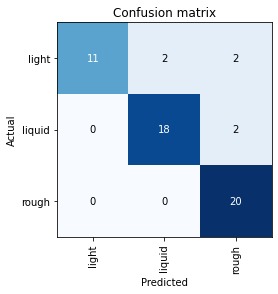

In [18]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

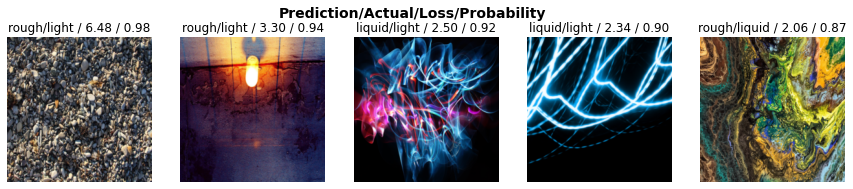

In [19]:
interp.plot_top_losses(5, nrows=1)

In [20]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [21]:
#hide
for idx in cleaner.delete(): cleaner.fns[idx].unlink()

In [22]:
#for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

(#0) []

## Turning Your Model into an Online Application

### Using the Model for Inference

In [23]:
learn.export()

In [24]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [25]:
learn_inf = load_learner(path/'export.pkl')

In [26]:
learn_inf.predict('/content/textures/light/00000000.jpg')

('light', tensor(0), tensor([0.9963, 0.0020, 0.0016]))

In [27]:
learn_inf.dls.vocab

['light', 'liquid', 'rough']

### Creating a Notebook App from the Model

In [28]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

In [29]:
#hide
# For the book, we can't actually click an upload button, so we fake it
btn_upload = SimpleNamespace(data = ['/content/textures/light/00000000.jpg'])

In [30]:
img = PILImage.create(btn_upload.data[-1])

In [31]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(128,128))
out_pl

Output()

In [32]:
pred,pred_idx,probs = learn_inf.predict(img)

In [33]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: light; Probability: 0.9963')

In [34]:
btn_run = widgets.Button(description='Classify')
btn_run

Button(description='Classify', style=ButtonStyle())

In [35]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [36]:
#hide
#Putting back btn_upload to a widget for next cell
btn_upload = widgets.FileUpload()

In [37]:
VBox([widgets.Label('Select your texture to get classified into Rough, Liquid, Light category!'), 
      btn_upload, btn_run, out_pl, lbl_pred])